In [23]:
import xarray as xr
import numpy as np

import hvplot.xarray


import cartopy.crs as crs
import matplotlib.pyplot as plt
import pandas as pd
import glob
import hvplot.pandas  # noqa
from datetime import timedelta
from datetime import datetime

import matplotlib.patches as patches
from matplotlib import colors

In [2]:
def dms2dd(degrees, minutes, seconds, direction):
    dd = degrees + minutes/60 + seconds/(60*60);
    if direction == 'W' or direction == 'S':
        dd *= -1
    return dd;

In [3]:
df = pd.read_csv("data/ivan_data/tsg_gps/EventData/DataLogger/Data every 1 min_001.elg")
df.head()

,Date,Time,SW-ZDA-Year,SW-ZDA-Month,SW-ZDA-Day,SW-ZDA-Time,SW-GGA-Lat,SW-GGA-NorS,SW-GGA-Long,SW-GGA-EorW,...,SW-Weather-HumidRel-%,SW-Wind-WindSpeedRel,SW-Wind-WindAngleRel,TrueWind-DRV-SPEED,TrueWind-DRV-DIRECTION,TSG--temp-SBE38,TSG--sal,SW-Depth-DBT-Depth below transducer (m),DepthOverall-DRV-VALUE,Unnamed: 24
0,08/25/2021,12:46:24,2021,8,25,124935.70,3433.3240,N,7610.8499,W,...,76.1,5.00,76.40,10.75,219.05,27.7042,35.6590,36.91,37.88,NaN
1,08/25/2021,12:47:25,2021,8,25,125035.70,3433.4081,N,7610.6764,W,...,75.7,4.49,86.89,12.15,215.33,27.6905,35.6585,37.36,38.36,NaN
2,08/25/2021,12:48:25,2021,8,25,125135.70,3433.4919,N,7610.5111,W,...,75.2,3.29,95.20,11.20,214.90,27.6949,35.6639,37.80,38.80,NaN
3,08/25/2021,12:49:25,2021,8,25,125235.69,3433.5739,N,7610.3362,W,...,75.6,5.29,80.90,12.10,213.94,27.6968,35.6928,36.98,37.98,NaN
4,08/25/2021,12:50:25,2021,8,25,125336.69,3433.6615,N,7610.1648,W,...,75.3,2.90,99.29,11.44,221.88,27.6971,35.6891,36.95,37.95,NaN


In [4]:
df = pd.read_csv('data/ivan_data/tsg_gps/Navigation/SW-GGA_20210825-082425.Raw', index_col=None,
                 names=['date', 'time','spacer', 'idk', 'lat','latdir', 'lon', 'londir', 'a','b','c','d','e','f','g'])
df

,date,time,spacer,idk,lat,latdir,lon,londir,a,b,c,d,e,f,g
0,08/25/2021,08:24:30.412,$GPGGA,82741.69,3443.0547,N,7640.2343,W,2,29,0.5,-28.5,M,-36.8,M*43
1,08/25/2021,08:24:31.506,$GPGGA,82742.69,3443.0547,N,7640.2343,W,2,29,0.5,-28.5,M,-36.8,M*40
2,08/25/2021,08:24:32.287,$GPGGA,82743.70,3443.0547,N,7640.2343,W,2,29,0.5,-28.5,M,-36.8,M*79
3,08/25/2021,08:24:33.709,$GPGGA,82744.70,3443.0547,N,7640.2342,W,2,29,0.5,-28.5,M,-36.8,M*7F
4,08/25/2021,08:24:34.631,$GPGGA,82745.70,3443.0547,N,7640.2342,W,2,28,0.5,-28.4,M,-36.8,M*7E
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
351316,08/30/2021,07:05:48.755,$GPGGA,70905.00,3443.0547,N,7640.2337,W,2,27,0.5,-26.9,M,-36.8,M*6E
351317,08/30/2021,07:05:50.907,$GPGGA,70907.00,3443.0548,N,7640.2337,W,2,26,0.5,-26.9,M,-36.8,M*62
351318,08/30/2021,07:05:51.988,$GPGGA,70908.00,3443.0548,N,7640.2337,W,2,26,0.5,-26.9,M,-36.8,M*6D
351319,08/30/2021,07:05:52.728,$GPGGA,70909.00,3443.0548,N,7640.2338,W,2,26,0.5,-27.0,M,-36.8,M*75


In [5]:
len(df)

351321

In [6]:
from datetime import datetime

date_time_strs = df['date'] + ' ' + df['time']

df['datetime'] = [datetime.strptime(x, '%m/%d/%Y %H:%M:%S.%f') for x in date_time_strs]
df['utc_dt'] = df['datetime']+ timedelta(minutes=4)
df  = df.set_index('utc_dt')

In [7]:
# date_time_strs = df['SW-ZDA-Year'].astype('str') + ' ' + df['SW-ZDA-Month'].astype('str') + ' ' + df['SW-ZDA-Day'].astype('str') + ' ' + df['SW-ZDA-Time'].astype('str').str[:-2].str.replace('.','')

# df['datetime'] = [datetime.strptime(x, '%Y %m %d %H%M%S') for x in date_time_strs]
# df['utc_dt'] = df['datetime']
# df  = df.set_index('utc_dt')

In [8]:
df

,date,time,spacer,idk,lat,latdir,lon,londir,a,b,c,d,e,f,g,datetime
utc_dt,,,,,,,,,,,,,,,,
2021-08-25 08:28:30.412,08/25/2021,08:24:30.412,$GPGGA,82741.69,3443.0547,N,7640.2343,W,2,29,0.5,-28.5,M,-36.8,M*43,2021-08-25 08:24:30.412
2021-08-25 08:28:31.506,08/25/2021,08:24:31.506,$GPGGA,82742.69,3443.0547,N,7640.2343,W,2,29,0.5,-28.5,M,-36.8,M*40,2021-08-25 08:24:31.506
2021-08-25 08:28:32.287,08/25/2021,08:24:32.287,$GPGGA,82743.70,3443.0547,N,7640.2343,W,2,29,0.5,-28.5,M,-36.8,M*79,2021-08-25 08:24:32.287
2021-08-25 08:28:33.709,08/25/2021,08:24:33.709,$GPGGA,82744.70,3443.0547,N,7640.2342,W,2,29,0.5,-28.5,M,-36.8,M*7F,2021-08-25 08:24:33.709
2021-08-25 08:28:34.631,08/25/2021,08:24:34.631,$GPGGA,82745.70,3443.0547,N,7640.2342,W,2,28,0.5,-28.4,M,-36.8,M*7E,2021-08-25 08:24:34.631
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-08-30 07:09:48.755,08/30/2021,07:05:48.755,$GPGGA,70905.00,3443.0547,N,7640.2337,W,2,27,0.5,-26.9,M,-36.8,M*6E,2021-08-30 07:05:48.755
2021-08-30 07:09:50.907,08/30/2021,07:05:50.907,$GPGGA,70907.00,3443.0548,N,7640.2337,W,2,26,0.5,-26.9,M,-36.8,M*62,2021-08-30 07:05:50.907
2021-08-30 07:09:51.988,08/30/2021,07:05:51.988,$GPGGA,70908.00,3443.0548,N,7640.2337,W,2,26,0.5,-26.9,M,-36.8,M*6D,2021-08-30 07:05:51.988


In [9]:
df['lon'] = dms2dd(pd.to_numeric(df['lon'].astype(str).str[:2]).astype(float), pd.to_numeric(df['lon'].astype(str).str[2:]),np.array(0), 'W')
df['lat'] = dms2dd(pd.to_numeric(df['lat'].astype(str).str[:2]).astype(float), pd.to_numeric(df['lat'].astype(str).str[2:]),np.array(0), 'E')

<AxesSubplot:>

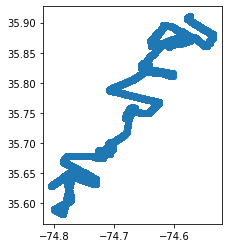

In [10]:
import geopandas as gpd

gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.lon, df.lat))
gdf.loc['2021-08-27 8:00:00':'2021-08-27 23:45:00'].plot()

In [11]:
df.hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.05,tiles='EsriNatGeo')

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [lon,lat]

In [12]:
start_times = ['2021-08-26 12:15:00', '2021-08-27 11:38:00', '2021-08-27 16:09:00', '2021-08-27 18:30:00', '2021-08-27 22:25:00', '2021-08-28 10:50:00',
               '2021-08-28 13:48:00', '2021-08-28 15:08:00', '2021-08-28 18:31:00', '2021-08-28 20:16:00', '2021-08-29 11:10:00', '2021-08-29 14:39:00',
               '2021-08-29 16:15:00']


end_times   = ['2021-08-26 14:12:00', '2021-08-27 12:52:00', '2021-08-27 17:40:00', '2021-08-27 18:45:00', '2021-08-27 23:35:00', '2021-08-28 12:05:00',
               '2021-08-28 14:05:00', '2021-08-28 16:48:00', '2021-08-28 18:56:00', '2021-08-28 21:50:00', '2021-08-29 13:40:00', '2021-08-29 15:00:00',
               '2021-08-29 17:52:00']

In [9]:
df.loc['2021-08-29 16:15:00':'2021-08-29 17:52:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.2,tiles='EsriNatGeo', width=500)

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [lon,lat]

In [10]:
df.loc['2021-08-25 23:00:00':'2021-08-27 17:45:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.2,tiles='EsriNatGeo', width=500)

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [lon,lat]

In [11]:
! ls data/ivan_data/cdom/

cdom_flu_output_210825_1.txt  cdom_flu_output_210828_1.txt
cdom_flu_output_210826_1.txt  cdom_flu_output_210829_1.txt
cdom_flu_output_210827_1.txt


In [12]:
cdom_files = [
    'data/ivan_data/cdom/cdom_flu_output_210825_1.txt',
    'data/ivan_data/cdom/cdom_flu_output_210826_1.txt',
    'data/ivan_data/cdom/cdom_flu_output_210827_1.txt',
    'data/ivan_data/cdom/cdom_flu_output_210828_1.txt',
    'data/ivan_data/cdom/cdom_flu_output_210829_1.txt'
             ]

cdom_dfs = []

for item in cdom_files:
    cdom_data = open(item)
    lines = cdom_data.readlines()
    sensor_values = []
    utc_times = []
    for i in range(len(lines)):
        line = lines[i]
        if "sensor" in line:
            try:
                line = line.split('= ')[1]
                line = line.replace('\n', '')
                sensor_values.append(int(line))
                if "UTC" in lines[i-1]:
                    data_time = lines[i-1][5:-2]
                    utc_times.append(data_time)
                elif "UTC" in lines[i+1]:
                    data_time = lines[i+1][5:-2]
                    utc_times.append(data_time)
            except:
                pass
    print(len(sensor_values)-len(utc_times))
    sensor_values = sensor_values[len(sensor_values)-len(utc_times):]
    utc_times = pd.to_datetime(utc_times)
    cdom_df = pd.DataFrame(np.array(sensor_values)/1024.0*5, columns = ['cdom_volts'])
    cdom_df['utc_dt'] = utc_times
    cdom_df  = cdom_df.set_index('utc_dt')
    cdom_dfs.append(cdom_df)
    
cdom_df = pd.DataFrame().append(cdom_dfs)

12
285
2
28
104


#### Visualizing SST from GOES

In [21]:
goes_ds = xr.open_dataset('data/jplStarG16SSTv270_8997_d932_2101.nc')

/srv/conda/envs/notebook/lib/python3.8/site-packages/xarray/conventions.py:492: SerializationWarning: variable 'sea_surface_temperature' has multiple fill values {-327.67, -327.68}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(


In [4]:
goes_ds.sea_surface_temperature[:,:, :].hvplot.quadmesh(
    'longitude', 'latitude', projection=crs.PlateCarree(), project=True,
    cmap='inferno', dynamic=True, 
    frame_height=600, clim=(25.5, 30), rasterize=True) #* df.loc['2021-08-27 11:00:00':'2021-08-29 13:45:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.01)

:DynamicMap   [time]
   :Image   [longitude,latitude]   (sea_surface_temperature)

In [14]:
goes_ds.sea_surface_temperature[284]

<xarray.DataArray 'sea_surface_temperature' (latitude: 301, longitude: 301)>
array([[  nan,   nan,   nan, ..., 28.28, 28.26, 28.25],
       [  nan,   nan,   nan, ..., 28.28, 28.29, 28.27],
       [  nan,   nan,   nan, ..., 28.33, 28.31, 28.27],
       ...,
       [  nan,   nan,   nan, ...,   nan,   nan,   nan],
       [  nan,   nan,   nan, ...,   nan,   nan,   nan],
       [  nan,   nan,   nan, ...,   nan,   nan,   nan]], dtype=float32)
Coordinates:
    time       object 2021-08-26 20:00:00
  * latitude   (latitude) float32 38.01 37.99 37.97 37.95 ... 32.05 32.03 32.01
  * longitude  (longitude) float32 -77.99 -77.97 -77.95 ... -72.03 -72.01 -71.99
Attributes:
    colorBarMaximum:  32.0
    colorBarMinimum:  0.0
    comment:          SST obtained by regression with buoy measurements, sens...
    grid_mapping:     crs
    ioos_category:    Temperature
    long_name:        Sea Surface Sub-Skin Temperature
    source:           NOAA
    standard_name:    sea_surface_subskin_temperature
    units:            degree_C
    valid_max:        327.67
    valid_min:        -327.67

<AxesSubplot:>

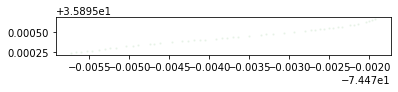

In [94]:
gdf.loc['2021-08-26 20:00:00':'2021-08-26 20:01:00'].plot(markersize=2, color='green', alpha=.05)

In [14]:
plt.rcParams.update({'font.size': 14})

In [15]:
import netCDF4
from netCDF4 import Dataset
from matplotlib import colors

In [16]:
fn = '../ocean_color/data/V2021239182400.L2_SNPP_OC.nc'     # Aug 27

dataset = Dataset(fn)
gd=dataset.groups['geophysical_data']
nav=dataset.groups['navigation_data']
lons = nav.variables["longitude"][:]
lats = nav.variables["latitude"][:]

flags= gd.variables["l2_flags"][:]
print(gd.variables.keys())
# # create the chl dataset
chl_ds_aug27 = xr.Dataset({'chlor_a':(('x', 'y'),gd.variables['chlor_a'][:].data)},
                    coords = {'lat': (('x', 'y'), lats),
                              'lon': (('x', 'y'), lons)},
                    attrs={'variable':'Chlorophyll-a'})
chl_ds_aug27 = chl_ds_aug27.where(chl_ds_aug27['chlor_a'] != -32767.0)
chl_ds_aug27

dict_keys(['aot_862', 'angstrom', 'Rrs_410', 'Rrs_443', 'Rrs_486', 'Rrs_551', 'Rrs_671', 'chlor_a', 'chl_ocx', 'Kd_490', 'pic', 'poc', 'par', 'l2_flags'])


<xarray.Dataset>
Dimensions:  (x: 3248, y: 3200)
Coordinates:
    lat      (x, y) float32 29.69 29.69 29.69 29.69 ... 44.5 44.49 44.49 44.48
    lon      (x, y) float32 -63.77 -63.78 -63.8 -63.82 ... -105.4 -105.4 -105.4
Dimensions without coordinates: x, y
Data variables:
    chlor_a  (x, y) float32 nan nan nan nan nan nan ... nan nan nan nan nan nan
Attributes:
    variable:  Chlorophyll-a

In [17]:
fn = '../ocean_color/data/V2021240180600.L2_SNPP_OC.nc'  # Aug 28

dataset = Dataset(fn)
gd=dataset.groups['geophysical_data']
nav=dataset.groups['navigation_data']
lons = nav.variables["longitude"][:]
lats = nav.variables["latitude"][:]

flags= gd.variables["l2_flags"][:]
print(gd.variables.keys())
# # create the chl dataset
chl_ds_aug28 = xr.Dataset({'chlor_a':(('x', 'y'),gd.variables['chlor_a'][:].data)},
                    coords = {'lat': (('x', 'y'), lats),
                              'lon': (('x', 'y'), lons)},
                    attrs={'variable':'Chlorophyll-a'})
chl_ds_aug28 = chl_ds_aug28.where(chl_ds_aug28['chlor_a'] != -32767.0)
chl_ds_aug28

dict_keys(['aot_862', 'angstrom', 'Rrs_410', 'Rrs_443', 'Rrs_486', 'Rrs_551', 'Rrs_671', 'chlor_a', 'chl_ocx', 'Kd_490', 'pic', 'poc', 'par', 'l2_flags'])


<xarray.Dataset>
Dimensions:  (x: 3232, y: 3200)
Coordinates:
    lat      (x, y) float32 33.3 33.3 33.3 33.3 33.3 ... 47.56 47.55 47.55 47.54
    lon      (x, y) float32 -59.4 -59.42 -59.44 -59.45 ... -103.3 -103.3 -103.4
Dimensions without coordinates: x, y
Data variables:
    chlor_a  (x, y) float32 nan nan nan nan nan nan ... nan nan nan nan nan nan
Attributes:
    variable:  Chlorophyll-a

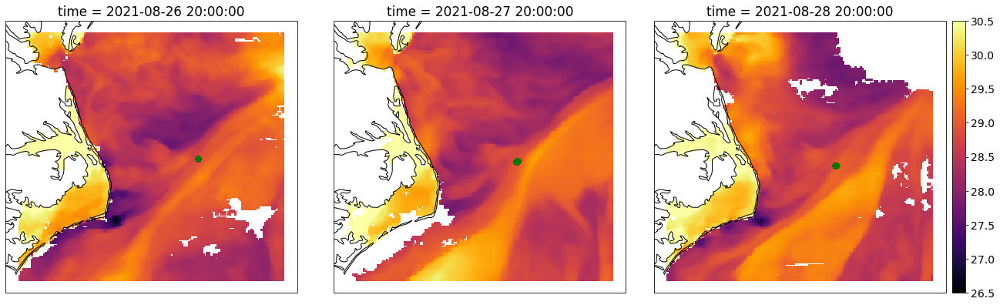

In [30]:
fig, ax = plt.subplots(1,3,figsize=(18.5,5.5), subplot_kw=dict(projection=crs.PlateCarree()))

ax[0].coastlines(resolution='10m')
goes_ds.sea_surface_temperature[284,35:175, 75:225].plot(ax=ax[0], vmin=26.5, vmax=30.5, cmap='inferno',add_colorbar=False)
gdf.loc['2021-08-26 20:00:00':'2021-08-26 20:10:00'].plot(ax=ax[0], markersize=40, color='green', alpha=.2)

ax[1].coastlines(resolution='10m')
goes_ds.sea_surface_temperature[284+24,35:175, 75:225].plot(ax=ax[1], vmin=26.5, vmax=30.5, cmap='inferno',add_colorbar=False)
gdf.loc['2021-08-27 20:00:00':'2021-08-27 20:10:00'].plot(ax=ax[1], markersize=40, color='green', alpha=.2)

ax[2].coastlines(resolution='10m')
im = goes_ds.sea_surface_temperature[284+24*2,35:175, 75:225].plot(ax=ax[2], vmin=26.5, vmax=30.5, cmap='inferno',add_colorbar=False)
gdf.loc['2021-08-28 20:00:00':'2021-08-28 20:10:00'].plot(ax=ax[2], markersize=40, color='green', alpha=.2)

plt.colorbar(im,fraction=0.046, pad=0.02)

# ax[1,1].coastlines(resolution='10m')
# goes_ds.sea_surface_temperature[284+24*4,50:200, 75:225].plot(ax=ax[1,1], vmin=26.5, vmax=30.5, cmap='inferno',add_colorbar=False)

# gdf.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].plot(ax=ax, markersize=2, color='green', alpha=.05)
fig.tight_layout()
# fig.savefig('sst_aug262728_2021_shiplocation.png',dpi=400)


In [18]:
# flight 1
gdf1 = gpd.read_file('../ocean_color/data/oc_analysis_20210827_A1_gulf_stream_surveys.shp')
gdf1['sst_c'] = gdf1['sst']-273.15
gdf1['time'] = pd.to_datetime(gdf1['time_str'])
gdf1['flight'] = 1

<AxesSubplot:>

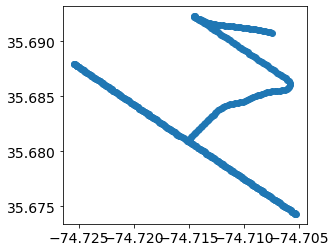

In [19]:
gdf1.plot()

In [47]:
1

1

/srv/conda/envs/notebook/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/srv/conda/envs/notebook/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:331: UserWarning: The .ylabels_left attribute is deprecated. Please use .left_labels to toggle visibility instead.
  warnings.warn('The .ylabels_left attribute is deprecated. Please '
/srv/conda/envs/notebook/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
/srv/conda/envs/notebook/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing

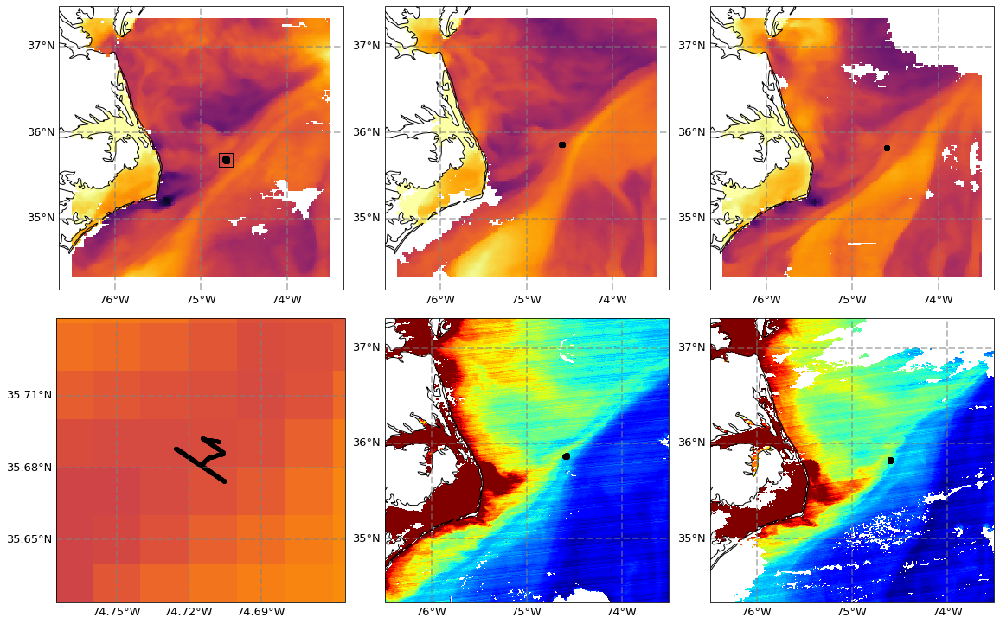

In [51]:
fig, ax = plt.subplots(2,3,figsize=(16,10), subplot_kw=dict(projection=crs.PlateCarree()))


### SST Section

ax[0,0].coastlines(resolution='10m')
goes_ds.sea_surface_temperature[284,35:185, 75:225].plot(ax=ax[0,0], vmin=26.5, vmax=30.5, cmap='inferno',add_colorbar=False)
# gdf.loc['2021-08-26 20:00:00':'2021-08-26 20:02:00'].plot(ax=ax[0,0], markersize=30, color='green', alpha=1)
gdf1.plot(ax=ax[0,0],markersize=30, color='black', alpha=1)
# gdf.plot(ax=ax[0,0], markersize=10, color='black', alpha=.2)

# gdf1.plot(ax=ax[0,0])
# rect study area
rect = patches.Rectangle((-74.725-0.07, 35.692+0.07), .165, -.165, linewidth=1, edgecolor='black', facecolor='none')
# Add the patch to the Axes
ax[0,0].add_patch(rect)

ax[0,1].coastlines(resolution='10m')
goes_ds.sea_surface_temperature[284+24,35:185, 75:225].plot(ax=ax[0,1], vmin=26.5, vmax=30.5, cmap='inferno',add_colorbar=False)
gdf.loc['2021-08-27 20:00:00':'2021-08-27 20:02:00'].plot(ax=ax[0,1], markersize=30, color='black', alpha=1)

ax[0,2].coastlines(resolution='10m')
im = goes_ds.sea_surface_temperature[284+24*2,35:185, 75:225].plot(ax=ax[0,2], vmin=26.5, vmax=30.5, cmap='inferno',add_colorbar=False)
gdf.loc['2021-08-28 20:00:00':'2021-08-28 20:02:00'].plot(ax=ax[0,2], markersize=30, color='black', alpha=1)

for i in range(3):
    ax[0,i].set_title("")
    
    gl = ax[0,i].gridlines(crs=crs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
    gl.xlabels_top = False
    gl.ylabels_left = True
    gl.ylabels_right = False
    # gl.xlines = False
    gl.xlocator = mticker.FixedLocator([-74,-75,-76])
    gl.ylocator = mticker.FixedLocator([34,35,36,37])
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': 13, 'color': 'black'}
    gl.ylabel_style = {'size': 13, 'color': 'black'}
    # plt.colorbar(im,fraction=0.046, pad=0.02)

### CHLA and Zoomed Section

ax[1,0].coastlines(resolution='10m')
goes_ds.sea_surface_temperature[284,35+50:185-50, 75+70:225-30].plot(ax=ax[1,0], vmin=28, vmax=29.2, cmap='inferno',add_colorbar=False)
# gdf.loc['2021-08-26 10:00:00':'2021-08-26 20:10:00'].plot(ax=ax[1,0], markersize=10, color='black', alpha=.2)
ax[1,0].set_xlim(-74.725-0.05,-74.705+0.05)
ax[1,0].set_ylim(35.674-0.05,35.692+0.05)
ax[1,0].set_title("")
gdf1.plot(ax=ax[1,0],markersize=15, color='black', alpha=.8)

chl_ds_aug27.chlor_a.plot(ax=ax[1,1],x='lon', y='lat', cmap='jet',vmax=2, vmin=0.05,norm=colors.LogNorm(), add_colorbar=False)
ax[1,1].coastlines(resolution='10m')
ax[1,1].set_xlim(-76.49,-73.51)
ax[1,1].set_ylim(34.33,37.31)
gdf.loc['2021-08-27 20:00:00':'2021-08-27 20:02:00'].plot(ax=ax[1,1], markersize=30, color='black', alpha=1)

chl_ds_aug28.chlor_a.plot(ax=ax[1,2],x='lon', y='lat', cmap='jet',vmax=2, vmin=0.05,norm=colors.LogNorm(), add_colorbar=False)
ax[1,2].coastlines(resolution='10m')
ax[1,2].set_xlim(-76.49,-73.51)
ax[1,2].set_ylim(34.33,37.31)
gdf.loc['2021-08-28 20:00:00':'2021-08-28 20:02:00'].plot(ax=ax[1,2], markersize=30, color='black', alpha=1)

for i in range(1,3):
    ax[1,i].set_title("")
    
    gl = ax[1,i].gridlines(crs=crs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
    gl.xlabels_top = False
    gl.ylabels_left = True
    gl.ylabels_right = False
    # gl.xlines = False
    gl.xlocator = mticker.FixedLocator([-74,-75,-76])
    gl.ylocator = mticker.FixedLocator([34,35,36,37])
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': 13, 'color': 'black'}
    gl.ylabel_style = {'size': 13, 'color': 'black'}
    # plt.colorbar(im,fraction=0.046, pad=0.02)
    
gl = ax[1,0].gridlines(crs=crs.PlateCarree(), draw_labels=True,
              linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_left = True
gl.ylabels_right = False
# gl.xlines = False
gl.xlocator = mticker.FixedLocator([-74.75,-74.72,-74.69])
gl.ylocator = mticker.FixedLocator([35.65,35.68,35.71])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'size': 13, 'color': 'black'}
gl.ylabel_style = {'size': 13, 'color': 'black'}


# fig.savefig('study_area_chla_V2021239182400_L2_SNPP_OC.png')

# gdf.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].plot(ax=ax, markersize=2, color='green', alpha=.05)
fig.tight_layout()
fig.savefig('studyarea_overview_aug262728_2021_shiplocation_revision1_color.png',dpi=600)


In [25]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import cartopy.crs as ccrs

from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

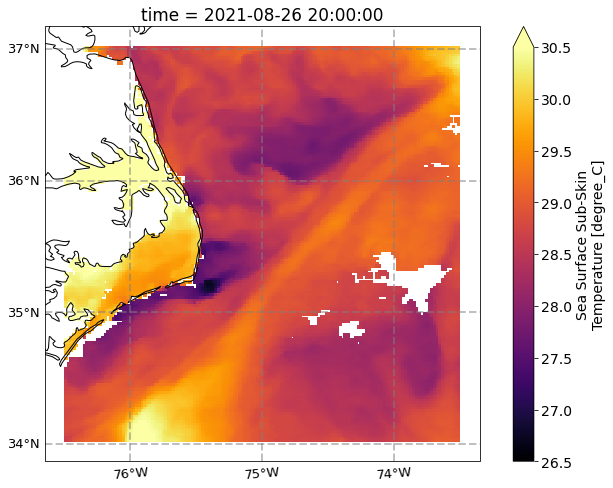

In [61]:
fig, ax = plt.subplots(figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
goes_ds.sea_surface_temperature[284,50:200, 75:225].plot(ax=ax, vmin=26.5, vmax=30.5, cmap='inferno')
# gdf.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].plot(ax=ax, markersize=2, color='green', alpha=.05)
# fig.savefig('sst_sept0523_studypoints.png',dpi=400)

gl = ax.gridlines(crs=crs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_left = True
gl.ylabels_right = False
# gl.xlines = False
gl.xlocator = mticker.FixedLocator([-74,-75,-76])
gl.ylocator = mticker.FixedLocator([34,35,36,37])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'size': 13, 'color': 'black', 'rotation':5}
gl.ylabel_style = {'size': 13, 'color': 'black'}
# gl.xlabel_style = {'color': 'red', 'weight': 'bold'}

# ax.tick_params(axis='x', which='minor', pad=45)

plt.show()

In [16]:
284+24

308

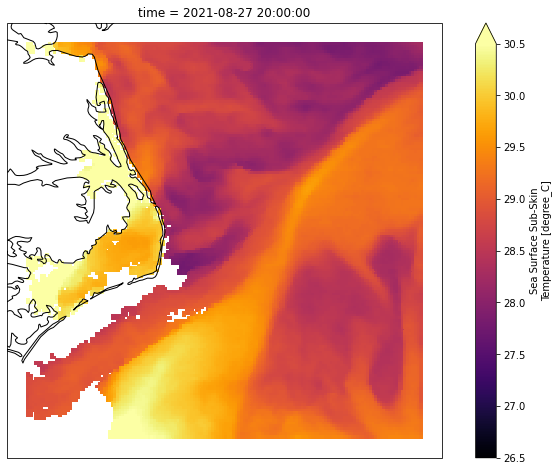

In [28]:
fig, ax = plt.subplots(figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
goes_ds.sea_surface_temperature[308,50:200, 75:225].plot(ax=ax, vmin=26.5, vmax=30.5, cmap='inferno')
# gdf.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].plot(ax=ax, markersize=2, color='green', alpha=.05)
# fig.savefig('sst_sept0523_studypoints.png',dpi=400)

In [23]:
308+24

332

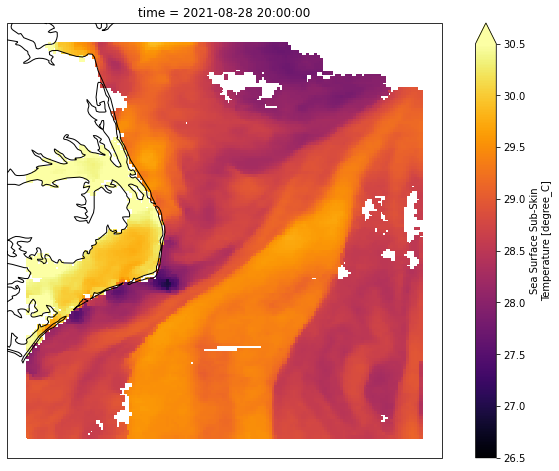

In [26]:
fig, ax = plt.subplots(figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
goes_ds.sea_surface_temperature[332,50:200, 75:225].plot(ax=ax, vmin=26.5, vmax=30.5, cmap='inferno')
# gdf.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].plot(ax=ax, markersize=2, color='green', alpha=.05)
# fig.savefig('sst_sept0523_studypoints.png',dpi=400)

In [34]:
308+24+24+24

380

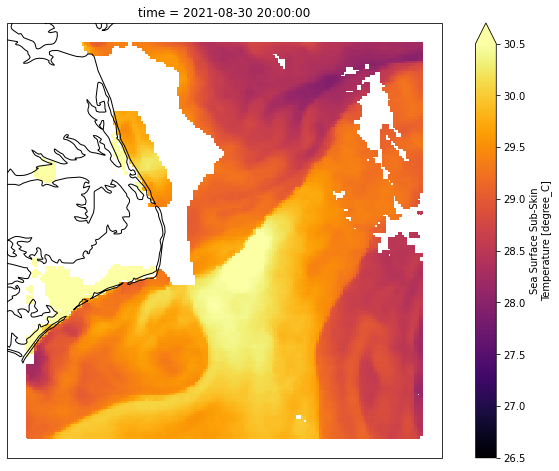

In [38]:
fig, ax = plt.subplots(figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
goes_ds.sea_surface_temperature[380,50:200, 75:225].plot(ax=ax, vmin=26.5, vmax=30.5, cmap='inferno')
# gdf.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].plot(ax=ax, markersize=2, color='green', alpha=.05)
# fig.savefig('sst_sept0523_studypoints.png',dpi=400)

In [ ]:
goes_ds.sea_surface_temperature[:,:, :].hvplot.quadmesh(
    'longitude', 'latitude', projection=crs.PlateCarree(), project=True,
    cmap='inferno', dynamic=True, 
    frame_height=600, clim=(25.5, 30), rasterize=True) #* df.loc['2021-08-27 11:00:00':'2021-08-29 13:45:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.01)

In [14]:
goes_ds.sea_surface_temperature[:,:, :].resample(time="6H", skipna=True).mean().hvplot.quadmesh(
    'longitude', 'latitude', projection=crs.PlateCarree(), project=True,
    cmap='inferno', dynamic=True, 
    frame_height=600, clim=(25.5, 30), rasterize=True) * df.loc['2021-08-27 11:00:00':'2021-08-29 13:45:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.01)

:DynamicMap   [time]
   :Overlay
      .Image.I  :Image   [longitude,latitude]   (sea_surface_temperature)
      .Points.I :Points   [lon,lat]

## Working through each transect with data and SST

In [ ]:
plt.rcParams.update({'font.size': 14})

In [298]:
start_times = ['2021-08-26 12:15:00', '2021-08-27 11:38:00', '2021-08-27 16:09:00', '2021-08-27 18:30:00', '2021-08-27 22:25:00', '2021-08-28 10:50:00',
               '2021-08-28 13:48:00', '2021-08-28 15:08:00', '2021-08-28 18:31:00', '2021-08-28 20:16:00', '2021-08-29 11:10:00', '2021-08-29 14:39:00',
               '2021-08-29 16:15:00']


end_times   = ['2021-08-26 14:12:00', '2021-08-27 12:52:00', '2021-08-27 17:40:00', '2021-08-27 18:45:00', '2021-08-27 23:35:00', '2021-08-28 12:05:00',
               '2021-08-28 14:05:00', '2021-08-28 16:48:00', '2021-08-28 18:56:00', '2021-08-28 21:50:00', '2021-08-29 13:40:00', '2021-08-29 15:00:00',
               '2021-08-29 17:52:00']

hours = [0,0,0,1,0,0,0,0,0,0,4,4,4]

titles = ['Transect 1', 'Transect 2', 'Transect 3', 'Transect 4', 
        'Transect 5', 'Transect 6', 'Transect 7', 'Transect 8',
        'Transect 9', 'Transect 10', 'Transect 11', 'Transect 12', 'Transect 13']

for i in range(13):
    # time series plot
    fig, ax = plt.subplots(figsize=(10,7))
    
    ax1 = ax.twinx()
    ax2 = ax.twinx()
    ax3 = ax.twinx()

    ax.set_ylim(25.5, 30.5)
    ax1.set_ylim(32, 37)
    ax2.set_ylim(.0, .25)
    ax3.set_ylim(.0, .40)

    ax.set_xlabel("Time (UTC)")
    ax.set_ylabel("Temperature (C)")
    ax1.set_ylabel("Salinity (PSU)")
    ax2.set_ylabel("CDOM (volts)")
    ax3.set_ylabel("Chla (mg/m3)")

    color1 = plt.cm.viridis(0)
    color2 = plt.cm.viridis(0.5)
    color3 = plt.cm.viridis(.9)
    
    p1, = ax.plot(df.loc[start_times[i]:end_times[i]].index, df.loc[start_times[i]:end_times[i]]['TSG--temp-SBE38'], color='red', label='Temp')
    p2, = ax1.plot(df.loc[start_times[i]:end_times[i]].index, df.loc[start_times[i]:end_times[i]]['TSG--sal'], label='Salinity')
    p3  = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=60).mean()['cdom_volts'], color='brown', label='CDOM', s=2)
    
    if trios_df.loc[start_times[i]:end_times[i]].rolling(window=6*3).mean()['chla_oci'].empty:
        trios_data_x = None
        trios_data_y = None
    else:
        trios_data_x = trios_df.loc[start_times[i]:end_times[i]].rolling(window=6*1).mean().index
        trios_data_y = trios_df.loc[start_times[i]:end_times[i]].rolling(window=6*1).mean()['chla_oci']
    p4  = ax3.scatter(trios_data_x, trios_data_y, color='green', label='Chla', s=2)
    
    #ax.set_title(titles[i])


#     p1, = ax.plot([0, 1, 2], [0, 1, 2],    color=color1, label="Density")
#     p2, = ax1.plot([0, 1, 2], [0, 3, 2],    color=color2, label="Temperature")
#     p3, = ax2.plot([0, 1, 2], [50, 30, 15], color=color3, label="Velocity")

    lns = [p1, p2, p3, p4]
    ax.legend(handles=lns, loc='best')

    # right, left, top, bottom
    ax2.spines['right'].set_position(('outward', 70))
    
    ax3.spines['right'].set_position(('outward', 150))

    # no x-ticks                 
#     ax2.xaxis.set_ticks([])
    fig.autofmt_xdate(rotation=45)

    # Sometimes handy, same for xaxis
    #par2.yaxis.set_ticks_position('right')

    # Move "Velocity"-axis to the left
    # par2.spines['left'].set_position(('outward', 60))
    # par2.spines['left'].set_visible(True)
    # par2.yaxis.set_label_position('left')
    # par2.yaxis.set_ticks_position('left')

    ax.yaxis.label.set_color(p1.get_color())
    ax1.yaxis.label.set_color(p2.get_color())
    ax2.yaxis.label.set_color('brown')
    ax3.yaxis.label.set_color('green')

    # Adjust spacings w.r.t. figsize
    fig.tight_layout()
    fig.savefig('figs/ivan_'+titles[i] +'.png')
    plt.close()
#     plt.show()
    
    
    
    # SST image
    
    fig, ax = plt.subplots(1,2, figsize=(20,8), subplot_kw=dict(projection=crs.PlateCarree()))
    ax[0].coastlines(resolution='10m')
    goes_ds.sel(time=slice(pd.to_datetime(start_times[i])-timedelta(hours=hours[i]), pd.to_datetime(end_times[i])+timedelta(hours=hours[i]))).sea_surface_temperature[:,:,:].mean(dim='time').plot(ax=ax[0], vmin=24.5, vmax=30, cmap='inferno')
    gdf.loc[start_times[i]:end_times[i]].plot(ax=ax[0], markersize=2, color='green', alpha=.05)
    
    ax[1].coastlines(resolution='10m')
    goes_ds.sel(time=slice(pd.to_datetime(start_times[i])-timedelta(hours=hours[i]), pd.to_datetime(end_times[i])+timedelta(hours=hours[i]))).sea_surface_temperature[:,75:175, 100:200].mean(dim='time').plot(ax=ax[1], vmin=24.5, vmax=30, cmap='inferno')
    gdf.loc[start_times[i]:end_times[i]].plot(ax=ax[1], markersize=2, color='green', alpha=.05)
    # fig.savefig('sst_sept0523_studypoints.png',dpi=400)
    ax[0].set_title(titles[i] + ' overview')
    ax[1].set_title(titles[i] + ' zoom')
    fig.tight_layout()
    fig.savefig('figs/ivan_'+titles[i] +'sat_overview.png')
    plt.close()
    plt.show()    

    # fig.savefig('transect' + str(i) '_s_t.png')

In [115]:
cdom_df.loc[start_times[i]:end_times[i]].rolling(window=60).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=60).mean()['cdom_volts']

(DatetimeIndex([], dtype='datetime64[ns]', name='utc_dt', freq=None),
 Series([], Name: cdom_volts, dtype: float64))

### Radiometer Data

In [16]:
trios_fns = [
    'data/ivan_data/trios/shearwater_trios_20210826.csv',
    'data/ivan_data/trios/shearwater_trios_20210827.csv',
    'data/ivan_data/trios/shearwater_trios_20210828.csv',
    'data/ivan_data/trios/shearwater_trios_20210829.csv',
            ]
trios_dfs = []
for fn in trios_fns:
    trios_dfs.append(pd.read_csv(fn))

trios_df = pd.DataFrame().append(trios_dfs)

In [17]:
trios_df['TimeStamp'].head()

0    08/26/2021 12:47:30
1    08/26/2021 12:48:00
2    08/26/2021 12:48:30
3    08/26/2021 12:49:00
4    08/26/2021 12:49:30
Name: TimeStamp, dtype: object

In [18]:
trios_df['datetime'] = pd.to_datetime(trios_df['TimeStamp'])
trios_df['utc_dt'] =trios_df['datetime'] + timedelta(hours=4) # moving it to UTC
trios_df = trios_df.set_index('utc_dt')

<AxesSubplot:xlabel='utc_dt'>

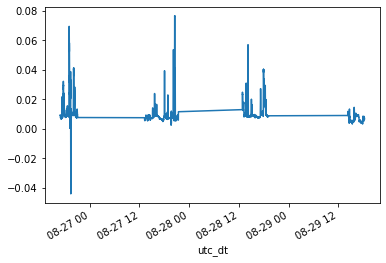

In [19]:
trios_df['400'].rolling(window=6*3).mean().plot()

In [22]:
trios_df['chla_oci'] = oc_index(trios_df.iloc[:, 156:161].mean(axis=1).values, trios_df.iloc[:, 232:240].mean(axis=1).values, trios_df.iloc[:, 346:351].mean(axis=1).values)

In [27]:
trios_df['chla_oci'][trios_df['chla_oci'] > 1 ] = np.nan

<ipython-input-27-07c79c7d9104>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trios_df['chla_oci'][trios_df['chla_oci'] > 1 ] = np.nan


(0.0, 0.4)

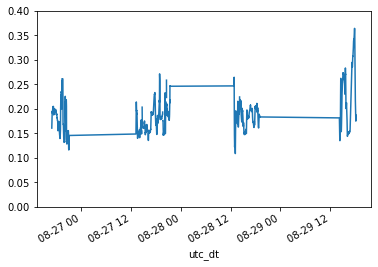

In [28]:
fig, ax = plt.subplots()
trios_df['chla_oci'].rolling(window=6*5).mean().plot(ax=ax)
ax.set_ylim(0,.4)

In [39]:
trios_df_transect = trios_df.loc['2021-08-29 13:15:00':'2021-08-29 18:30:00']
df_transect = df.loc['2021-08-29 13:15:00':'2021-08-29 18:30:00']
cdom_df_transect = cdom_df.loc['2021-08-29 13:15:00':'2021-08-29 18:30:00']

In [40]:
cdom_df

,cdom_volts
utc_dt,
2021-08-25 19:08:09.767570,0.039062
2021-08-25 19:08:10.267780,0.107422
2021-08-25 19:08:10.768130,0.063477
2021-08-25 19:08:11.268490,0.058594
2021-08-25 19:08:11.772180,0.073242
...,...
2021-08-30 05:14:09.552950,0.200195
2021-08-30 05:14:10.057330,0.200195
2021-08-30 05:14:10.558430,0.209961


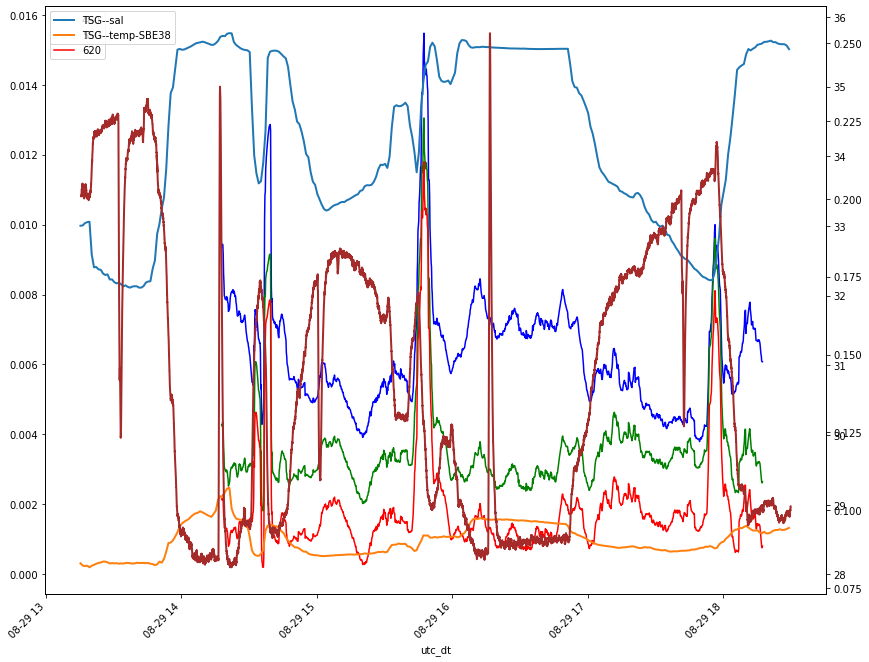

In [49]:
fig, ax = plt.subplots(figsize=(14,12))

ax2 = ax.twinx()

df_transect.plot(y='TSG--sal',ax=ax2, linewidth=2)
df_transect.plot(y='TSG--temp-SBE38',ax=ax2, linewidth=2)
ax2.legend()
ax3 = ax.twinx()
cdom_df_transect.cdom_volts.rolling(window=60).mean().plot(color='brown', ax=ax3, linewidth=2, label='1min Binned CDOM (volts*100+25)')



# trios_df_transect['400'].rolling(window=6*3).mean().plot(ax=ax)
# trios_df_transect['440'].rolling(window=6*3).mean().plot(ax=ax)
trios_df_transect['460'].rolling(window=6*3).mean().plot(ax=ax, color='blue')
# trios_df_transect['480'].rolling(window=6*3).mean().plot(ax=ax)
# trios_df_transect['500'].rolling(window=6*3).mean().plot(ax=ax)
trios_df_transect['550'].rolling(window=6*3).mean().plot(ax=ax, color='green')
trios_df_transect['620'].rolling(window=6*3).mean().plot(ax=ax, color='red')
# trios_df_transect['900'].rolling(window=6*3).mean().plot(ax=ax)

# trios_gdf.loc['2021-08-27 16:15:00':'2021-08-27 17:30:00'].plot('chl', ax=ax)

ax.legend(loc='upper left')


# ax.set_ylim(0.000,0.012)
fig.autofmt_xdate(rotation=45)
# fig.savefig('sal_temp_cdom_radiometry.png')

In [299]:
plt.rcParams.update({'font.size': 16})

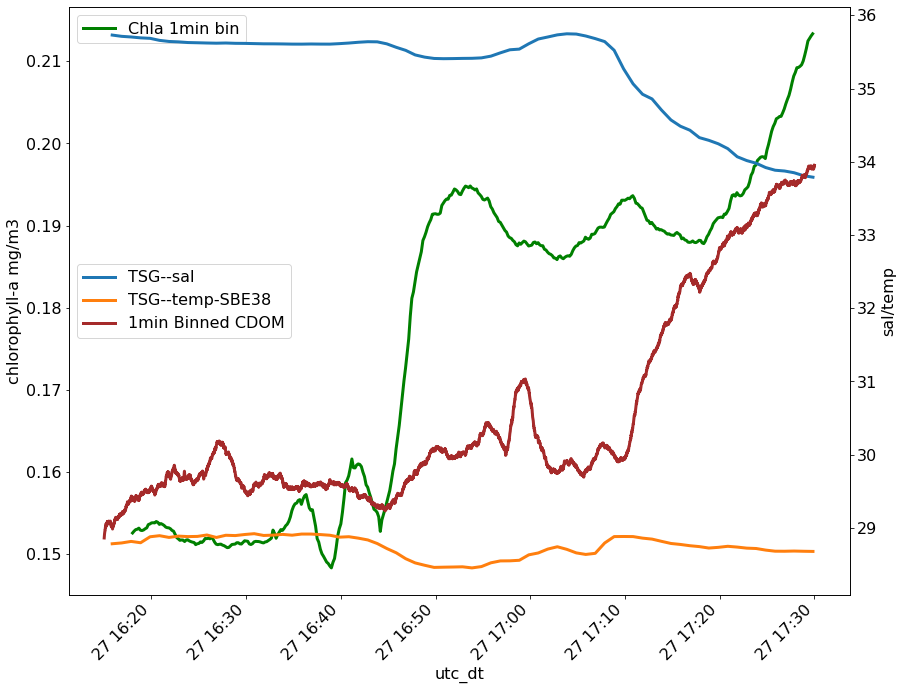

In [302]:
fig, ax = plt.subplots(figsize=(14,12))

ax2 = ax.twinx()

df_transect.plot(y='TSG--sal',ax=ax2, linewidth=3)
df_transect.plot(y='TSG--temp-SBE38',ax=ax2, linewidth=3)
(cdom_df_transect.bin_cdom*100+25).plot(color='brown', ax=ax2, linewidth=3, label='1min Binned CDOM')
ax2.legend()


trios_df_transect['chl'].rolling(window=6*3).mean().plot(ax=ax, color='green', label='Chla 1min bin', linewidth=3)

# trios_gdf.loc['2021-08-27 16:15:00':'2021-08-27 17:30:00'].plot('chl', ax=ax)

ax.legend(loc='upper left')
ax.set_ylabel('chlorophyll-a mg/m3')
ax2.set_ylabel('sal/temp')


# ax.set_ylim(0.000,0.012)
fig.autofmt_xdate(rotation=45)
fig.savefig('sal_temp_cdom_chla.png')

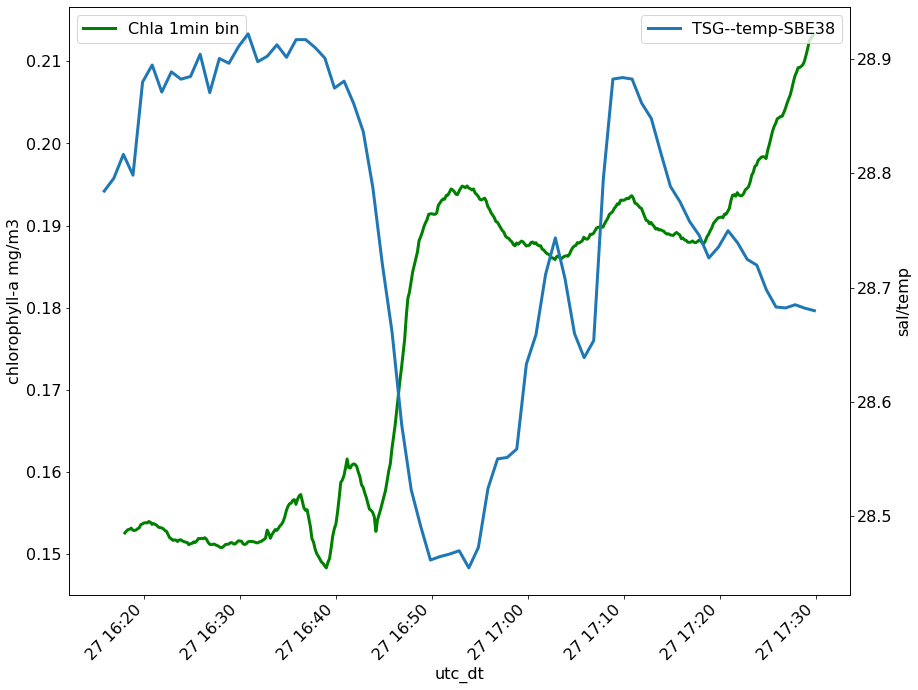

In [407]:
fig, ax = plt.subplots(figsize=(14,12))

ax2 = ax.twinx()

# df_transect.plot(y='TSG--sal',ax=ax2, linewidth=3)
df_transect.plot(y='TSG--temp-SBE38',ax=ax2, linewidth=3)
# (cdom_df_transect.bin_cdom*100+25).plot(color='brown', ax=ax2, linewidth=3, label='1min Binned CDOM')
ax2.legend()


trios_df_transect['chl'].rolling(window=6*3).mean().plot(ax=ax, color='green', label='Chla 1min bin', linewidth=3)

# trios_gdf.loc['2021-08-27 16:15:00':'2021-08-27 17:30:00'].plot('chl', ax=ax)

ax.legend(loc='upper left')
ax.set_ylabel('chlorophyll-a mg/m3')
ax2.set_ylabel('sal/temp')


# ax.set_ylim(0.000,0.012)
fig.autofmt_xdate(rotation=45)
# fig.savefig('sal_temp_cdom_chla.png')

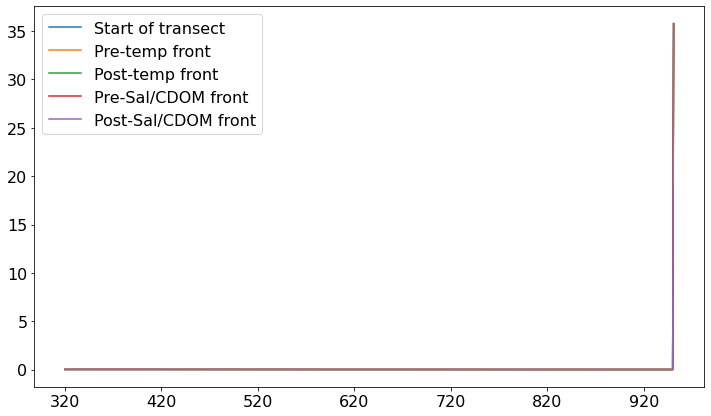

In [427]:
fig,ax = plt.subplots(figsize=(12,7))
trios_df_transect.loc['2021-08-27 16:15:00':'2021-08-27 16:20:00'].median(numeric_only=True).iloc[:-2].plot(label='Start of transect')

trios_df_transect.loc['2021-08-27 16:37:00':'2021-08-27 16:43:00'].median(numeric_only=True).iloc[:-2].plot(label='Pre-temp front')
trios_df_transect.loc['2021-08-27 16:48:00':'2021-08-27 16:53:00'].median(numeric_only=True).iloc[:-2].plot(label='Post-temp front')
trios_df_transect.loc['2021-08-27 17:02:00':'2021-08-27 17:08:00'].median(numeric_only=True).iloc[:-2].plot(label='Pre-Sal/CDOM front')
trios_df_transect.loc['2021-08-27 17:23:00':'2021-08-27 17:38:00'].median(numeric_only=True).iloc[:-2].plot(label='Post-Sal/CDOM front')

ax.legend()
# plt.savefig('radiometry_spectra.png')


<AxesSubplot:>

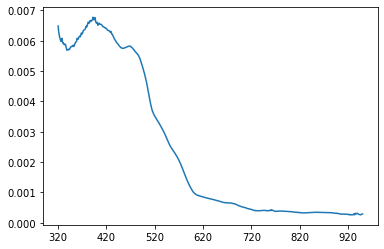

In [155]:
lats = []
lons = []
for i in range(len(trios_df)):
    row = df.iloc[df.index.get_loc(pd.to_datetime(trios_df.iloc[i].TimeStamp) + timedelta(hours=4), method='nearest')]
    lats.append(row.lat)
    lons.append(row.lon)

In [156]:
trios_df['lat'] = lats
trios_df['lon'] = lons

In [157]:
import geopandas as gpd

trios_gdf = gpd.GeoDataFrame(
    trios_df, geometry=gpd.points_from_xy(trios_df.lon, trios_df.lat))

<AxesSubplot:>

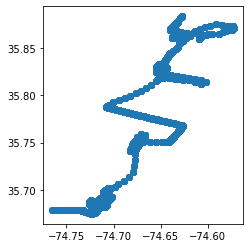

In [158]:
trios_gdf.plot()

In [166]:
trios_gdf.columns[1:-4]

Index(['320', '321', '322', '323', '324', '325', '326', '327', '328', '329',
       ...
       '941', '942', '943', '944', '945', '946', '947', '948', '949', '950'],
      dtype='object', length=631)

In [21]:
ci1 = -0.49
ci2 = 191.6590

# ci1 = -0.38152295986028695
# ci2 = 271.37634868

# average of 443*.5 + 489*1.5
# ci1 = -0.30002281538304754
# ci2 = 310.5772338

# ci1 = -0.21380600002416383
# ci2 = 572.01573044



def oc_index(blue, green, red):
    blue, green, red = blue, green, red
    CI = green - ( blue + (555 - 477)/(667 - 477) * (red - blue) )
    
    #print(green)
    #print(( blue + (555 - 443)/(667 - 443) * (red - blue) ))
    
    #print(CI)

    ChlCI = 10**(ci1 + ci2*CI)
    return(ChlCI)

In [243]:
chlci = oc_index(trios_gdf.iloc[:, 156:161].mean(axis=1).values, trios_gdf.iloc[:, 232:240].mean(axis=1).values, trios_gdf.iloc[:, 346:351].mean(axis=1).values)

In [251]:
chlci[chlci>.5] = .5

(0.1, 0.32)

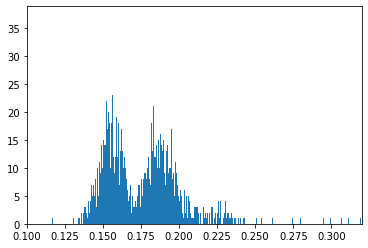

In [253]:
plt.hist(chlci, bins=2000)
plt.xlim(0.1,.32)

In [222]:
trios_gdf.iloc[:, 156:161].mean(axis=1).values

array([0.00719962, 0.00702049, 0.00608499, ..., 0.01105115, 0.00601578,
       0.00627533])

In [232]:
trios_gdf.iloc[:, 232:240].mean(axis=1).values

utc_dt
2021-08-27 13:11:50    0.004480
2021-08-27 13:12:00    0.004295
2021-08-27 13:12:10    0.003679
2021-08-27 13:12:20    0.006315
2021-08-27 13:12:30    0.004902
                         ...   
2021-08-27 21:23:00    0.003440
2021-08-27 21:23:10    0.004263
2021-08-27 21:23:20    0.008379
2021-08-27 21:23:30    0.003110
2021-08-27 21:23:40    0.003312
Length: 2919, dtype: float64

In [239]:
trios_gdf.iloc[:, 346:351].mean(axis=1).values

array([0.00259821, 0.00234837, 0.00205165, ..., 0.00616506, 0.00132067,
       0.0014643 ])

In [178]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=15, random_state=0).fit(trios_gdf.values[:,1:-4])

In [179]:
np.unique(kmeans.labels_, return_counts=True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14],
       dtype=int32),
 array([1581,    1,    4,   18,    2,   31,    1,    7,   15,    1,    3,
          48, 1190,   16,    1]))

In [258]:
trios_gdf['chl'] = chlci

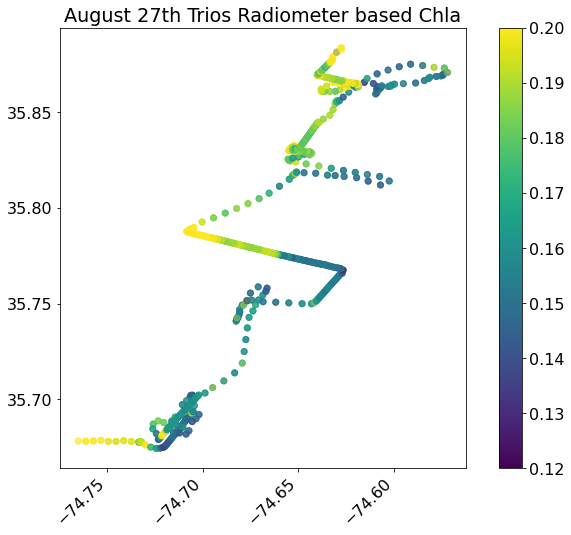

In [308]:
fig, ax = plt.subplots(figsize=(12,9))
sc = trios_gdf.plot('chl', ax=ax, vmin=.12,vmax=.20, cmap='viridis', alpha=0.3, label='CI Chla', legend=True)
# ss = ax.scatter(trios_gdf.lon, trios_gdf.lat, c=trios_gdf.chl, s=100)
# fig.colorbar(sc,ax=ax)
# fig.colorbar(sc, ax=ax)
fig.autofmt_xdate(rotation=45)
ax.set_title('August 27th Trios Radiometer based Chla')
fig.savefig('trios_radiometers_chlaci.png')

<AxesSubplot:>

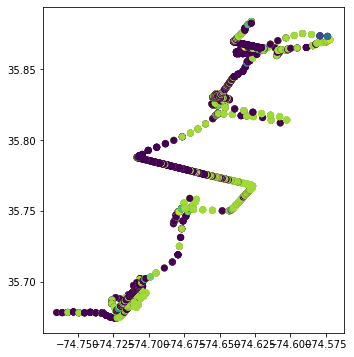

In [283]:
fig, ax = plt.subplots(figsize=(8,6))
trios_gdf.plot(c=kmeans.labels_,ax=ax)

In [310]:
trios_gdf_transect = trios_gdf.loc['2021-08-27 16:15:00':'2021-08-27 17:30:00']

In [379]:
x = trios_gdf_transect.rolling(window=6).mean().values[:,1:-5]

In [380]:
x = x[12:,:]

In [381]:
from sklearn.preprocessing import StandardScaler
# Standardizing the features
x = StandardScaler().fit_transform(x)

In [382]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)

In [383]:
principalComponents.shape

(433, 2)

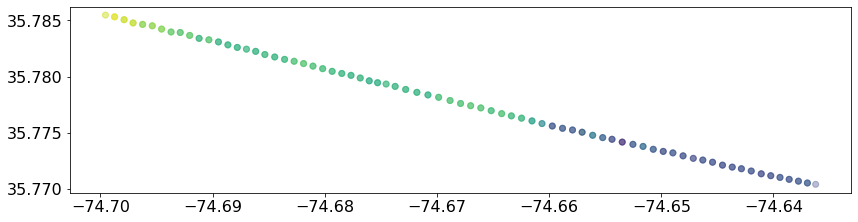

In [413]:
fig, ax = plt.subplots(figsize=(14,11))
trios_gdf_transect.iloc[12:].plot(c=trios_gdf_transect.iloc[12:].chl,ax=ax, alpha=0.2, vmin=0.2, vmax=.24)
fig.savefig('chla_transect.png')

In [ ]:
fig, ax = plt.subplots(figsize=(14,11))
trios_gdf_transect.iloc[12:].plot(c=trios_gdf_transect.iloc[12:].chl,ax=ax, alpha=0.2, vmin=0.2, vmax=.24)

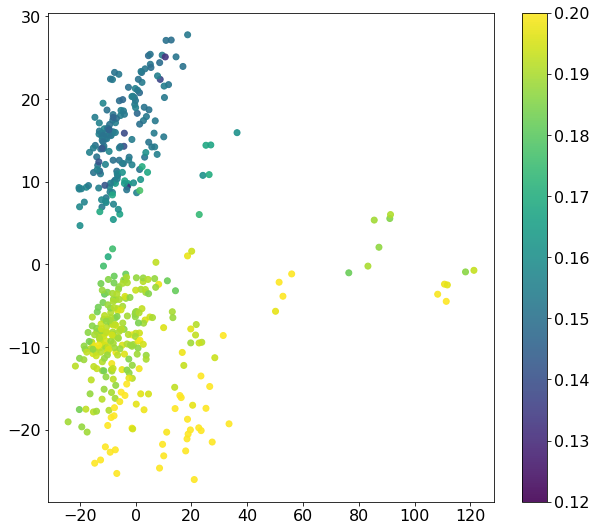

In [420]:
fig, ax = plt.subplots(figsize=(10,9))
sc = ax.scatter(principalComponents[:,0], principalComponents[:,1], alpha=0.9, c=trios_gdf_transect['chl'].iloc[12:], vmin=.12,vmax=.20, cmap='viridis', label='chla')
fig.colorbar(sc)
# ax.set_ylim(-3,2)
# ax.set_xlim(-6,8)
fig.savefig('pca_transect.png')

In [423]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=5, random_state=0).fit(x)
np.unique(kmeans.labels_, return_counts=True)

(array([0, 1, 2, 3, 4], dtype=int32), array([ 55, 210,  12,  44, 112]))

<AxesSubplot:>

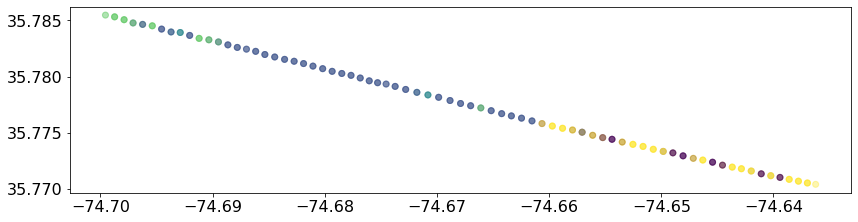

In [424]:
fig, ax = plt.subplots(figsize=(14,11))
trios_gdf_transect.iloc[12:].plot(c=kmeans.labels_,ax=ax, alpha=0.2)

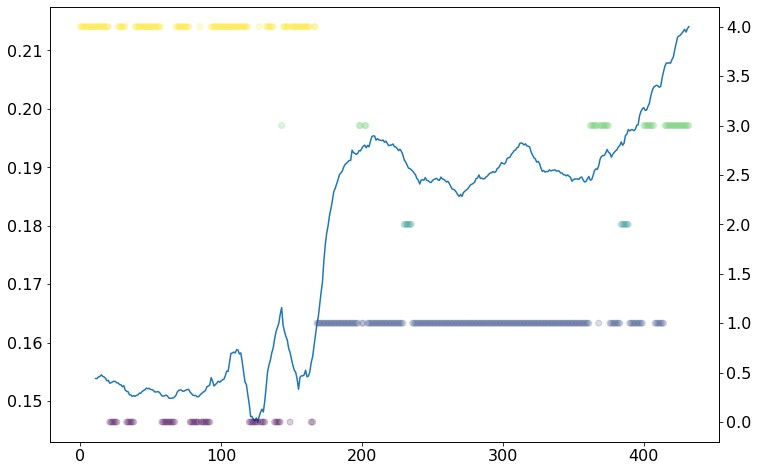

In [426]:
fig, ax  =plt.subplots(figsize=(12,8))
ax.plot(np.arange(0,len(x)),trios_gdf_transect.chl.iloc[12:].rolling(window=12).mean())
ax2=ax.twinx()
ax2.scatter(np.arange(0,len(x)), kmeans.labels_, alpha=0.2, c=kmeans.labels_)
fig.savefig('cluster_chla.png')

In [88]:
lats = []
lons = []
for i in range(len(trios_df_transect)):
    row = df_transect.iloc[df_transect.index.get_loc(pd.to_datetime(trios_df_transect.iloc[i].TimeStamp) + timedelta(hours=4), method='nearest')]
    lats.append(row.lat)
    lons.append(row.lon)

In [91]:
trios_df_transect['lat'] = lats
trios_df_transect['lon'] = lons

<ipython-input-91-aaa7d1eefef1>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trios_df_transect['lat'] = lats
<ipython-input-91-aaa7d1eefef1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trios_df_transect['lon'] = lons


In [93]:
import geopandas as gpd

trios_gdf_transect = gpd.GeoDataFrame(
    trios_df_transect, geometry=gpd.points_from_xy(trios_df_transect.lon, trios_df_transect.lat))

<AxesSubplot:>

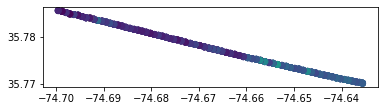

In [100]:
trios_gdf.plot('455')